## Data Wrangling and EDA for Wildlife Image Classification

The data for this project is sourced from https://www.kaggle.com/datasets/akash2907/bird-species-classification 

### Load Data and Import Packages

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

import imageio.v2 as imageio
import cv2

#### Visualizing one image

In [2]:
# load two images
im1 = imageio.imread('../jpeg/train/blasti/DSC_6382.jpg')
im2 = imageio.imread('../jpeg/train/blasti/DSC_6389.jpg')

# Print image attributes
print('Image type:', type(im1))
print('Shape of image1 array:', im1.shape)
print('Shape of image2 array:', im2.shape)


Image type: <class 'numpy.ndarray'>
Shape of image1 array: (4000, 6016, 3)
Shape of image2 array: (2671, 6016, 3)


In [3]:
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
im2 = cv2.resize(im2, (300, 300))
im2.shape

(300, 300)

In [4]:
# Print available metadata fields
#print(im1.meta.keys())

In [5]:
#im1.meta.EXIF_MAIN

There is some metadata associated with the photo settings for each image, but I will not use this type of data for the purposes of this project.

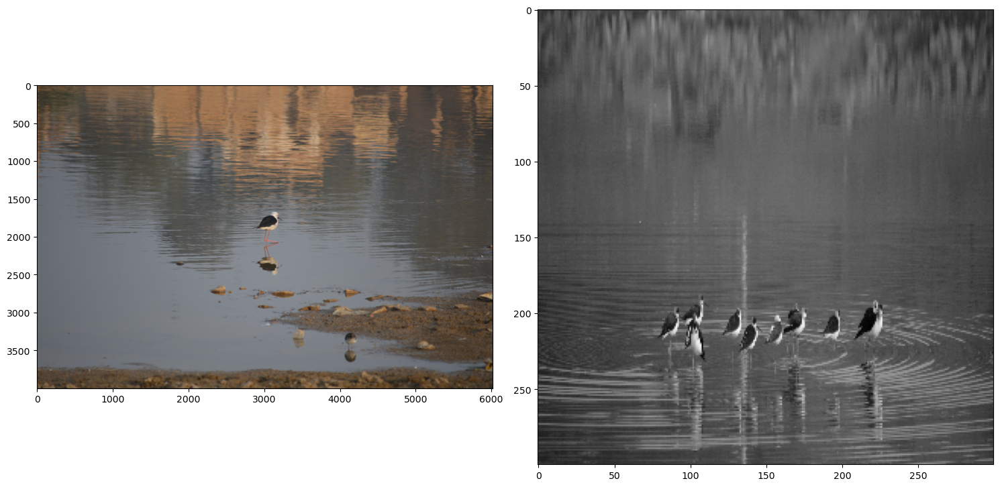

In [6]:
# view images
fig, ax = plt.subplots(nrows=1, ncols=2, tight_layout=True, figsize=(15,15))

ax[0].imshow(im1, cmap='gray')
ax[1].imshow(im2, cmap='gray');


The image on the left is an example of a camera trap image before resizing and converting to grayscale. The image on the right is processed for grayscale and resizing (300 x 300). When loading all images below, I will convert to grayscale and resize.

#### Loading all images

In [7]:
# set path and folder names
train_path = "../jpeg/train"
folder_names = os.listdir(train_path)[1:]
len(folder_names)

16

In [8]:
# load images

data=[]
labels = []

for folder in folder_names:
    img_path = os.path.join(train_path, folder) 
    
    for filename in os.listdir(img_path):
        if filename.endswith((".jpg",".JPG")):
            img = imageio.imread(os.path.join(img_path, filename))
            img = cv2.resize(img, (300, 300)) #resize
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY ) #convert to grayscale

            data.append(img)
            labels.append(folder)

    
x_train = np.array(data)
x_train_labels = np.array(labels)
print("success")

success


In [9]:
x_train.shape

(149, 300, 300)

In [10]:
x_train_labels.shape

(149,)

In [11]:
len(np.unique(x_train_labels))

16

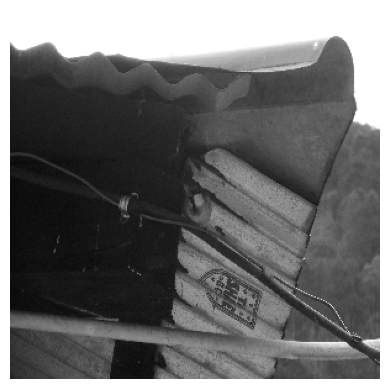

In [12]:
# Plot sample image
plt.imshow(x_train[9], cmap='gray')
plt.axis('off');

### Plot all images
The images below show all the training images for the 16 species of Himalayan birds, labeled by codename.

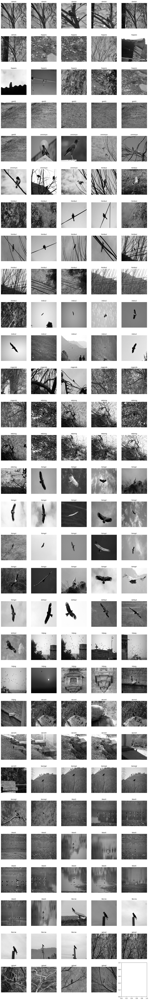

In [14]:
fig, axs = plt.subplots(nrows=30, ncols=5, tight_layout=True, figsize=(15,100))

i=0 #set counter for labels

for ax, image in zip(axs.ravel(), x_train):
    ax.imshow(image, cmap='gray')
    ax.axis('off')
    ax.set_title(x_train_labels[i])
    i +=1
    


From the images above, we can see how much variation there is in the types of bird photos caught by the camera traps. The pictures vary in the complexity of the background vegetation, the pose/angle of the bird and how obscured it is by vegetation, as well as bird size and how far the bird is from the camera. Some photos also contain multiple birds.

One issue worth considering is whether the modeling will be more successful if color is included in the images, since this can be valuable information for bird species identification. 
